In [1]:
import cv2
import numpy as np
import imageio
import math
import matplotlib.pyplot as plt

def canny_edge_detection(image_path, threshold1=50, threshold2=150, blur_kernel=(17, 17), blur_sigma=0):
    # Load the image in BGR format
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise FileNotFoundError(f"Image not found: {image_path}")
    
    # Resize the image to a fixed size for consistent processing
    img_bgr = cv2.resize(img_bgr, (1024, 1024), interpolation=cv2.INTER_AREA)
    
    # Convert the image to grayscale
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian blur to reduce noise
    img_blur = cv2.GaussianBlur(img_gray, blur_kernel, blur_sigma)
    
    # Perform Canny edge detection
    edges = cv2.Canny(img_blur, threshold1, threshold2)
    
    return edges

In [2]:
def fast_hough_transform(img, angle_step=1):
    """
    Fast Hough Transform using NumPy vectorized operations
    Input:
        img - 2D binary edge-detected image (output of Canny)
        angle_step - Spacing between angles (default: 1 degree)
    Output:
        accumulator - 2D Hough transform accumulator
        thetas - Array of angle values (radians)
        rhos - Array of rho values
    """
    # Define theta (angle) range
    thetas = np.deg2rad(np.arange(-90.0, 90.0, angle_step))
    
    # Get image dimensions
    height, width = img.shape
    diag_len = int(np.ceil(np.sqrt(height**2 + width**2)))  # Max possible rho value
    rhos = np.linspace(-diag_len, diag_len, 2 * diag_len)

    # Cache cosine and sine values for speed optimization
    cos_t = np.cos(thetas)
    sin_t = np.sin(thetas)
    num_thetas = len(thetas)

    # Create Hough accumulator
    accumulator = np.zeros((2 * diag_len, num_thetas))

    # Get edge coordinates
    y_idxs, x_idxs = np.nonzero(img)  # Get indices of edge points

    # Compute rho values for all thetas using vectorized NumPy operations
    xcos_thetas = np.dot(x_idxs.reshape((-1, 1)), cos_t.reshape((1, -1)))
    ysinthetas = np.dot(y_idxs.reshape((-1, 1)), sin_t.reshape((1, -1)))
    rhos_mat = np.round(xcos_thetas + ysinthetas) + diag_len
    rhos_mat = rhos_mat.astype(np.int16)

    # Efficiently update accumulator using np.unique
    for i in range(num_thetas):
        rhos_unique, counts = np.unique(rhos_mat[:, i], return_counts=True)
        accumulator[rhos_unique, i] += counts

    return accumulator, thetas, rhos

In [3]:
def show_hough_transform(img, accumulator, thetas, rhos, save_path=None, line_threshold=100):
    """ 
    Displays the original image with detected lines and the Hough transform 
    - img: Input Canny Edge Image
    - accumulator: Hough Space Accumulator
    - thetas, rhos: Hough Transform parameters
    - save_path: Optional, save the output figure
    - line_threshold: Minimum votes required to consider a detected line
    """
    
    # Convert grayscale image to RGB for visualization
    img_with_lines = np.dstack([img]*3)  # Convert grayscale to RGB

    # Detect peaks in accumulator
    detected_lines = np.argwhere(accumulator > line_threshold)  # Get rho, theta indices

    for rho_idx, theta_idx in detected_lines:
        rho = rhos[rho_idx]
        theta = thetas[theta_idx]

        # Compute two points on the detected line
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))  # Extend the line
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))

        # Draw the detected line (Red color)
        rr, cc = np.linspace(y1, y2, 1000).astype(int), np.linspace(x1, x2, 1000).astype(int)
        valid_idx = (rr >= 0) & (rr < img.shape[0]) & (cc >= 0) & (cc < img.shape[1])
        img_with_lines[rr[valid_idx], cc[valid_idx]] = [255, 0, 0]  # Red color

    # Create a plot showing both results
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    # Original Image with Detected Lines
    ax[0].imshow(img_with_lines)
    ax[0].set_title('Detected Lines (Hough Transform)')
    ax[0].axis('off')

    # Hough Transform Accumulator
    ax[1].imshow(
        accumulator, cmap='jet', 
        extent=[np.rad2deg(thetas[-1]), np.rad2deg(thetas[0]), rhos[-1], rhos[0]]
    )
    ax[1].set_aspect('auto')
    ax[1].set_title('Hough Transform')
    ax[1].set_xlabel('Theta (degrees)')
    ax[1].set_ylabel('Rho (pixels)')

    # Save or show plot
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

In [4]:
# --------------------------
# 4. RANSAC for Line Fitting
# --------------------------
def ransac_line_fitting(points, num_iterations=1000, distance_threshold=2.0, min_inlier_ratio=0.1):
    """
    Fit a line to 2D points using RANSAC.
    Returns line parameters (a, b, c) for ax + by + c = 0 and a Boolean mask for inliers.
    """
    if len(points) < 2:
        raise ValueError("Not enough points to fit a line.")

    best_inliers = None
    best_line = None
    max_inliers_count = 0
    n_points = points.shape[0]

    for _ in range(num_iterations):
        # Randomly pick 2 different points
        idx = np.random.choice(n_points, 2, replace=False)
        p1 = points[idx[0]]
        p2 = points[idx[1]]

        # Skip if the selected points are too close
        if np.allclose(p1, p2):
            continue

        # Calculate line coefficients: ax + by + c = 0
        x1, y1 = p1
        x2, y2 = p2
        a = y2 - y1
        b = x1 - x2
        c = x2 * y1 - x1 * y2

        # Avoid division by zero or unstable values
        denominator = np.sqrt(a**2 + b**2)
        if denominator < 1e-8:
            continue

        # Compute perpendicular distances of all points to the line
        distances = np.abs(a * points[:, 0] + b * points[:, 1] + c) / denominator
        inliers = distances < distance_threshold
        inliers_count = np.sum(inliers)

        # Update best model if current one has more inliers
        if inliers_count > max_inliers_count:
            max_inliers_count = inliers_count
            best_inliers = inliers
            best_line = (a, b, c)

            # Early exit if a good enough model is found
            if max_inliers_count > min_inlier_ratio * n_points:
                break

    return best_line, best_inliers

In [5]:
# --------------------------
# 5. Refining a Candidate Hough Line with RANSAC
# --------------------------
def refine_line_with_ransac(edge_img, rho, theta, distance_threshold=2.0, num_iterations=500):
    """
    Given a candidate line (rho, theta) from the Hough transform, refine it using RANSAC.
    Returns a refined line in ax + by + c = 0 format.
    """
    # Get coordinates of all edge pixels
    y_idxs, x_idxs = np.nonzero(edge_img)
    points = np.column_stack((x_idxs, y_idxs))
    
    # Convert the Hough line from polar to Cartesian form: a*x + b*y + c = 0
    a = np.cos(theta)
    b = np.sin(theta)
    c = -rho  # rho = a*x + b*y → a*x + b*y - rho = 0 → c = -rho

    # Calculate the perpendicular distance of each edge point to the candidate line
    denominator = np.sqrt(a**2 + b**2)
    distances = np.abs(a * points[:, 0] + b * points[:, 1] + c) / denominator
    
    # Keep only points that are close enough to the line
    candidate_points = points[distances < distance_threshold]
    
    # If not enough points remain, skip refinement
    if candidate_points.shape[0] < 2:
        return None
    
    # Use RANSAC to find the best fitting line among the candidate points
    refined_line, inlier_mask = ransac_line_fitting(candidate_points,
                                                    num_iterations=num_iterations,
                                                    distance_threshold=distance_threshold)
    return refined_line

In [6]:
def extract_and_refine_lines(accumulator, thetas, rhos, edge_img, hough_threshold=320, distance_threshold=2.0, num_iterations=500):
    """
    Extracts candidate lines from the Hough accumulator and refines them using RANSAC.
    
    Parameters:
      accumulator: Hough transform accumulator.
      thetas: Array of theta values (radians).
      rhos: Array of rho values.
      edge_img: Binary edge image (from Canny).
      hough_threshold: Vote threshold to consider a candidate line.
      distance_threshold: Maximum distance for inliers in RANSAC.
      num_iterations: Number of iterations for RANSAC.
      
    Returns:
      refined_lines: List of refined line parameters (a, b, c) for each candidate.
    """
    # Find candidate lines by thresholding the accumulator
    detected_candidates = np.argwhere(accumulator > hough_threshold)
    refined_lines = []
    
    # Refine each candidate line using RANSAC
    for rho_idx, theta_idx in detected_candidates:
        candidate_rho = rhos[rho_idx]
        candidate_theta = thetas[theta_idx]
        
        refined = refine_line_with_ransac(
            edge_img,
            candidate_rho,
            candidate_theta,
            distance_threshold=distance_threshold,
            num_iterations=num_iterations
        )
        
        if refined is not None:
            refined_lines.append(refined)
    
    return refined_lines

def visualize_refined_lines(edge_img, refined_lines):
    """
    Visualizes the refined lines on top of the edge image.
    
    Parameters:
      edge_img: Binary edge image.
      refined_lines: List of refined line parameters (a, b, c).
    """
    # Convert grayscale edge image to color for visualization
    img_with_refined = np.dstack([edge_img]*3)
    
    # Draw each line using its (a, b, c) parameters
    for (a, b, c) in refined_lines:
        x0 = 0
        y0 = int(- (c + a * x0) / b) if b != 0 else 0
        x1 = img_with_refined.shape[1]
        y1 = int(- (c + a * x1) / b) if b != 0 else img_with_refined.shape[0]
        
        plt.plot([x0, x1], [y0, y1], 'r-', linewidth=2)
    
    plt.imshow(img_with_refined)
    plt.title('Refined Lines after RANSAC')
    plt.axis('off')
    plt.show()

In [7]:
# --------------------------
# 6. Detecting left,right,top,bottom lines
# --------------------------

def separate_lines_by_angle(refined_lines, tolerance=10):
    """
    Separates lines into two groups based on their angle.

    Parameters:
      refined_lines: List of lines in (a, b, c) format.
      tolerance: Angle threshold (in degrees) used to decide group membership.

    Returns:
      group1, group2: Two groups of lines with roughly perpendicular orientations.
    """
    group1 = []
    group2 = []
    angles = []

    # Compute angles of all lines with respect to x-axis
    for (a, b, c) in refined_lines:
        angle = np.degrees(np.arctan2(b, a)) % 180
        angles.append(angle)

    if not angles:
        return group1, group2

    # Use the median angle as the base for group1
    base_angle = np.median(angles)
    # The perpendicular angle becomes the base for group2
    perp_angle = (base_angle + 90) % 180

    for idx, (a, b, c) in enumerate(refined_lines):
        angle = angles[idx]
        # Calculate the shortest distance between angles in a circular space
        diff1 = min(abs(angle - base_angle), 180 - abs(angle - base_angle))
        diff2 = min(abs(angle - perp_angle), 180 - abs(angle - perp_angle))

        # Assign the line to the closer group
        if diff1 <= diff2:
            group1.append((a, b, c))
        else:
            group2.append((a, b, c))

    return group1, group2


def find_left_right_lines(verticals):
    """
    Finds the leftmost and rightmost vertical lines based on x-intercepts.

    Parameters:
      verticals: List of vertical lines in (a, b, c) format.

    Returns:
      left_line, right_line: Lines with minimum and maximum x-intercepts.
    """
    left_line = None
    right_line = None
    min_x = float('inf')
    max_x = float('-inf')

    for (a, b, c) in verticals:
        if abs(a) < 1e-9:
            continue
        x_int = -c / a

        if x_int < min_x:
            min_x = x_int
            left_line = (a, b, c)
        if x_int > max_x:
            max_x = x_int
            right_line = (a, b, c)

    return left_line, right_line


def find_top_bottom_lines(horizontals):
    """
    Finds the topmost and bottommost horizontal lines based on y-intercepts.

    Parameters:
      horizontals: List of horizontal lines in (a, b, c) format.

    Returns:
      top_line, bottom_line: Lines with minimum and maximum y-intercepts.
    """
    top_line = None
    bottom_line = None
    min_y = float('inf')
    max_y = float('-inf')

    for (a, b, c) in horizontals:
        if abs(b) < 1e-9:
            continue
        y_int = -c / b

        if y_int < min_y:
            min_y = y_int
            top_line = (a, b, c)
        if y_int > max_y:
            max_y = y_int
            bottom_line = (a, b, c)

    return top_line, bottom_line


def line_intersection(line1, line2):
    """
    Computes the intersection point of two lines.

    Parameters:
      line1, line2: Tuples in (a, b, c) format for ax + by + c = 0.

    Returns:
      (x, y): Intersection point, or None if lines are parallel.
    """
    (a1, b1, c1) = line1
    (a2, b2, c2) = line2

    denom = a1 * b2 - a2 * b1
    if abs(denom) < 1e-9:
        return None

    x = (b1 * c2 - b2 * c1) / denom
    y = (c1 * a2 - c2 * a1) / denom
    return (x, y)


def draw_lines_and_corners(image, left_line, right_line, top_line, bottom_line, color=(0,255,0), thickness=2):
    """
    Draws the outer quadrilateral formed by 4 lines and their intersections.

    Parameters:
      image: Input image to draw on.
      left_line, right_line, top_line, bottom_line: Four border lines.
      color: Line color.
      thickness: Line thickness.

    Returns:
      image with drawn lines and corners, and array of corner points.
    """
    # 1. Find intersection points (corners)
    top_left     = line_intersection(left_line,  top_line)
    top_right    = line_intersection(right_line, top_line)
    bottom_left  = line_intersection(left_line,  bottom_line)
    bottom_right = line_intersection(right_line, bottom_line)

    corners = [top_left, top_right, bottom_right, bottom_left]

    # 2. Get drawable points from line equations
    def get_points_on_line(line, shape, num_points=2):
        (a, b, c) = line
        h, w = shape[:2]
        points = []

        for x in [0, w-1]:
            if abs(b) > 1e-9:
                y = (-c - a*x) / b
                if 0 <= y < h:
                    points.append((int(x), int(y)))

        for y in [0, h-1]:
            if abs(a) > 1e-9:
                x = (-c - b*y) / a
                if 0 <= x < w:
                    points.append((int(x), int(y)))

        return points

    # 3. Draw lines
    for line in [left_line, right_line, top_line, bottom_line]:
        pts = get_points_on_line(line, image.shape)
        if len(pts) >= 2:
            cv2.line(image, pts[0], pts[1], color, thickness)

    # 4. Draw corner points
    for corner in corners:
        if corner is not None:
            cx, cy = map(int, corner)
            cv2.circle(image, (cx, cy), 5, (0, 0, 255), -1)

    # 5. Draw polygon connecting corners
    pts_array = []
    for corner in corners:
        if corner is not None:
            pts_array.append([int(corner[0]), int(corner[1])])

    pts_array = np.array(pts_array, dtype=np.int32)
    pts_array = pts_array.reshape((-1, 1, 2))

    cv2.polylines(image, [pts_array], isClosed=True, color=(255, 0, 0), thickness=2)

    return image, pts_array

In [8]:
# --------------------------
# 7. Detect and visualize quadrilateral
# --------------------------

def detect_and_visualize_quadrilateral(image_path, refined_lines, edges, printing):
    # Load the original image
    img = cv2.imread(image_path)
    
    # Split the lines into vertical and horizontal groups based on their angles
    verticals, horizontals = separate_lines_by_angle(refined_lines, tolerance=10)
    
    # Optionally visualize verticals or horizontals if needed
    # visualize_refined_lines(edges, verticals)
    # visualize_refined_lines(edges, horizontals)
    
    # Identify the leftmost and rightmost vertical lines
    left_line, right_line = find_left_right_lines(verticals)
    # Identify the topmost and bottommost horizontal lines
    top_line, bottom_line = find_top_bottom_lines(horizontals)
    
    # Draw the detected boundary lines and their intersection corners
    result_image, pts_array = draw_lines_and_corners(edges.copy(), left_line, right_line, top_line, bottom_line)
    
    if printing:
        # Show the result with lines and corners
        plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
        plt.title("Detected Quadrilateral")
        plt.axis("off")
        plt.show()
    
    return result_image, pts_array

In [38]:
# --------------------------
# 8. Warping the Image
# --------------------------

def get_homography_matrix(src_pts, dst_pts):
    """
    Computes the homography matrix H such that: dst ≈ H * src
    This uses the Direct Linear Transform (DLT) method.

    Parameters:
      - src_pts: 4 source points (Nx2 NumPy array)
      - dst_pts: 4 destination points (Nx2 NumPy array)

    Returns:
      - H: 3x3 homography matrix
    """
    if src_pts.shape != (4, 2) or dst_pts.shape != (4, 2):
        raise ValueError("Both src_pts and dst_pts must be of shape (4, 2)")

    A = []
    # Build matrix A for solving Ah = 0
    for i in range(4):
        x, y = src_pts[i]
        x_p, y_p = dst_pts[i]

        # Two rows per correspondence
        A.append([-x, -y, -1, 0, 0, 0, x*x_p, y*x_p, x_p])
        A.append([0, 0, 0, -x, -y, -1, x*y_p, y*y_p, y_p])

    A = np.array(A)

    # Solve using SVD (last row of V gives solution)
    _, _, Vt = np.linalg.svd(A)
    H = Vt[-1].reshape(3, 3)

    # Normalize so that H[2,2] = 1
    return H / H[2, 2]

def warp_image_manual(img, H, output_shape):
    """
    Applies a perspective warp using vectorized inverse mapping (NumPy only, no OpenCV).

    Parameters:
      - img: Input image as a NumPy array
      - H: 3x3 homography matrix
      - output_shape: (height, width) of the output image

    Returns:
      - warped: Warped image with the specified output shape
    """
    H_inv = np.linalg.inv(H)
    h_out, w_out = output_shape

    # Create grid of (x, y) coordinates in destination image
    x_coords, y_coords = np.meshgrid(np.arange(w_out), np.arange(h_out))
    ones = np.ones_like(x_coords)

    # Shape: (3, N) where N = total number of pixels
    target_coords = np.stack([x_coords, y_coords, ones], axis=-1).reshape(-1, 3).T

    # Apply inverse homography to map target pixels back to source image
    src_coords = H_inv @ target_coords
    src_coords /= src_coords[2, :]  # Normalize

    x_src = np.round(src_coords[0, :]).astype(int)
    y_src = np.round(src_coords[1, :]).astype(int)

    # Filter valid source coordinates within image bounds
    valid_mask = (
        (x_src >= 0) & (x_src < img.shape[1]) &
        (y_src >= 0) & (y_src < img.shape[0])
    )

    x_dst = target_coords[0, valid_mask].astype(int)
    y_dst = target_coords[1, valid_mask].astype(int)

    warped = np.zeros((h_out, w_out, 3), dtype=np.uint8)
    warped[y_dst, x_dst] = img[y_src[valid_mask], x_src[valid_mask]]

    return warped

def warp_image(img_path, pts_array, printing):
    """
    Full warp pipeline:
    - Load the image
    - Estimate homography matrix using corner points
    - Manually apply perspective warp using that matrix

    Parameters:
      - img_path: Path to the input image
      - pts_array: Array of 4 points (TL, TR, BR, BL)
      - printing: If True, displays original and warped images

    Returns:
      - warped: The resulting warped image
    """
    # Load and resize the image
    img = cv2.imread(img_path)
    img = cv2.resize(img, (1024, 1024), interpolation=cv2.INTER_AREA)

    if img is None:
        raise ValueError("Image could not be loaded. Check the file path.")

    # Clean up the shape of the point array if needed
    if pts_array.ndim == 3 and pts_array.shape[1] == 1:
        pts = pts_array[:, 0, :].astype("float32")
    else:
        pts = pts_array.reshape(4, 2).astype("float32")

    # Unpack the 4 source points
    (tl, tr, br, bl) = pts

    # Estimate the output width and height
    widthA = np.linalg.norm(br - bl)
    widthB = np.linalg.norm(tr - tl)
    maxWidth = int(max(widthA, widthB))

    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    maxHeight = int(max(heightA, heightB))

    # Define the destination points in the output image
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]
    ], dtype="float32")

    # Compute homography and apply manual warp
    H = get_homography_matrix(pts, dst)
    warped = warp_image_manual(img, H, (maxHeight, maxWidth))

    if printing:
        # Show original and warped images side by side
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        plt.title("Warped Image (Manual)")
        plt.axis("off")
        plt.show()

    return warped

In [ ]:
# --------------------------
# 9. Comparing images by SSIM
# --------------------------

from skimage.metrics import structural_similarity as ssim

def compare_images_ssim(warped, compare_img_path, printing):
    """
    Compares a warped image with a reference image using SSIM (Structural Similarity Index).

    Parameters:
      - warped: The processed (warped) image as a NumPy array.
      - compare_img_path: Path to the reference (ground truth) image.
      - printing: If True, display the images and print the SSIM score.

    Returns:
      - score_gray: SSIM score between the grayscale versions of both images.
      - diff_gray: Full SSIM difference map.
    """
    # Load the reference image
    compare_img = cv2.imread(compare_img_path)

    # Resize reference image to match the warped image's size
    (h, w) = warped.shape[:2]
    compare_img_resized = cv2.resize(compare_img, (w, h))

    # Convert both images to grayscale
    warped_gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    compare_gray = cv2.cvtColor(compare_img_resized, cv2.COLOR_BGR2GRAY)

    # Calculate SSIM and get the difference map
    score_gray, diff_gray = ssim(warped_gray, compare_gray, full=True)

    if printing:
        # Print the score and show both images side-by-side
        print("SSIM Score:", score_gray)

        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        plt.title("Warped Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(compare_img_resized, cv2.COLOR_BGR2RGB))
        plt.title("Compare Image Resized")
        plt.axis("off")

        plt.show()

    return score_gray, diff_gray

In [39]:
# --------------------------
# 10. General function for doing all processes by one image
# --------------------------

def all_processes_for_one_image(image_path1, image_path2, hough_threshold, printing):
    """
    Runs the full pipeline on a single image pair:
    1. Edge detection
    2. Hough Transform
    3. RANSAC line refinement
    4. Quadrilateral detection
    5. Perspective warping
    6. Image comparison using SSIM

    Parameters:
      - image_path1: Path to the distorted input image.
      - image_path2: Path to the reference digital image.
      - hough_threshold: Threshold value to select strong lines from the Hough accumulator.
      - printing: If True, visualizations will be shown at each step.

    Returns:
      - score_gray: SSIM score between the warped and reference image.
    """
    try:
        # Step 1: Load image and perform edge detection
        img = cv2.imread(image_path1)
        edges = canny_edge_detection(image_path1)

        # Step 2: Apply Hough Transform
        accumulator, thetas, rhos = fast_hough_transform(edges)

        if printing:
            # Optional: Visualize Hough space
            show_hough_transform(edges, accumulator, thetas, rhos, line_threshold=100)

        # Step 3: Refine detected lines using RANSAC
        refined_lines = extract_and_refine_lines(
            accumulator, thetas, rhos, edges,
            hough_threshold=hough_threshold,
            distance_threshold=0.5,
            num_iterations=500
        )

        # Step 4: Detect quadrilateral from refined lines
        result_img, pts_array = detect_and_visualize_quadrilateral(
            image_path1, refined_lines, edges, printing
        )

        # Step 5: Warp the original image based on detected corners
        warped_img = warp_image(image_path1, pts_array, printing)

        # Step 6: Compare the warped image with the reference image using SSIM
        score_gray, diff_gray = compare_images_ssim(warped_img, image_path2, printing)

        return score_gray

    except Exception as e:
        print(f"Error processing image {image_path1}: {e}")
        return None

In [60]:
# ==========================
#        CURVED FOLDER
# ==========================
# This block processes 50 image pairs inside the "curved" folder.
# For each pair, it runs the full pipeline: edge detection → Hough transform → RANSAC → warping → SSIM.
# It stores the SSIM scores and corresponding image paths, then prints the top 2 image pairs with the highest similarity.

import os

distorted_dir = "WarpDoc/distorted/curved/"
digital_dir = "WarpDoc/digital/curved/"

scores = []
paths = []
printing = False

# Process images 0001.jpg to 0050.jpg
for i in range(1, 51):
    filename = f"{i:04}.jpg"
    path_distorted = os.path.join(distorted_dir, filename)
    path_digital = os.path.join(digital_dir, filename)
    
    score_gray = all_processes_for_one_image(
        path_distorted, 
        path_digital, 
        hough_threshold=100,
        printing=printing
    )

    if score_gray is not None:
        scores.append(score_gray)
        paths.append((path_distorted, path_digital))

# Combine scores and paths for sorting
combined = list(zip(scores, paths))
combined.sort(key=lambda x: x[0], reverse=True)  # Sort by SSIM score in descending order

# Select top 2 highest SSIM results
top2 = combined[:2]

# Print the top results
for idx, (score, (distorted_path, digital_path)) in enumerate(top2, 1):
    print(f"{idx}. Highest SSIM score: {score}")
    print(f"   Distorted Path: {distorted_path}")
    print(f"   Digital Path:   {digital_path}")

# Calculate and print the average SSIM score
if scores:
    average_score = sum(scores) / len(scores)
    print(f"\nAverage SSIM score across all images: {average_score}")
else:
    print("\nNo SSIM scores were computed.")

Error processing image WarpDoc/distorted/curved/0006.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/curved/0007.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Error processing image WarpDoc/distorted/curved/0012.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/curved/0017.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Error processing image WarpDoc/d

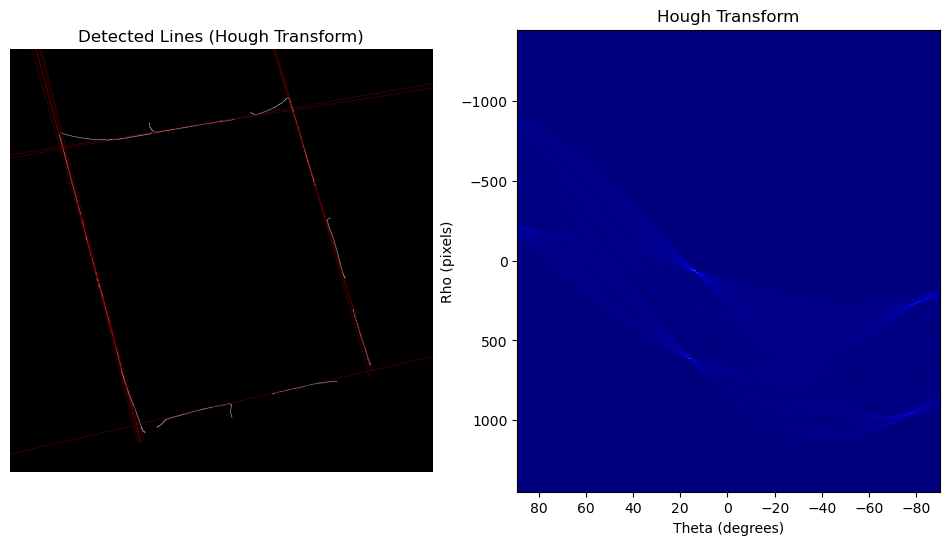

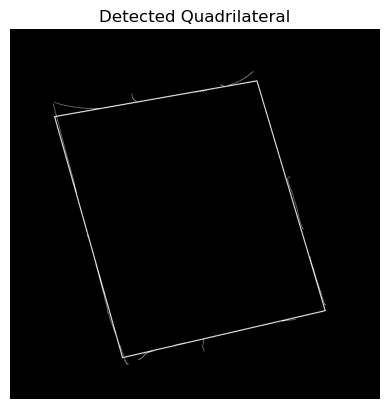

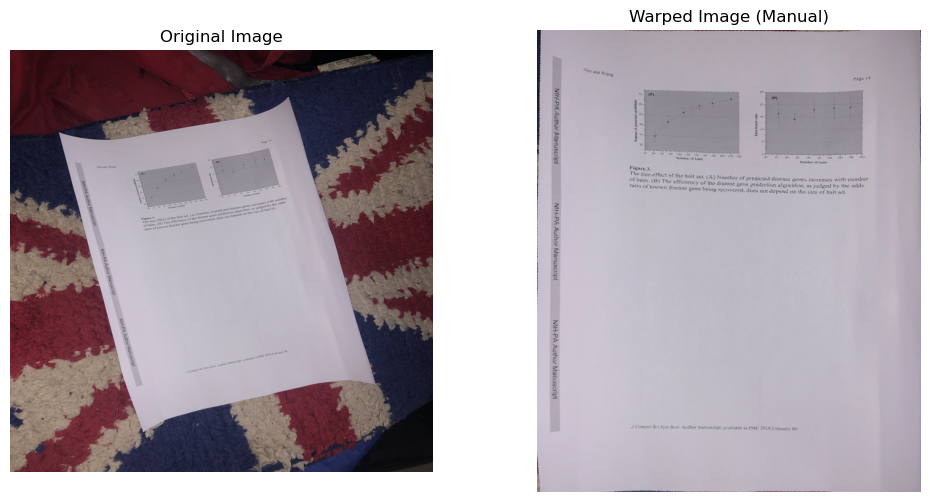

SSIM Score: 0.8087092745115593


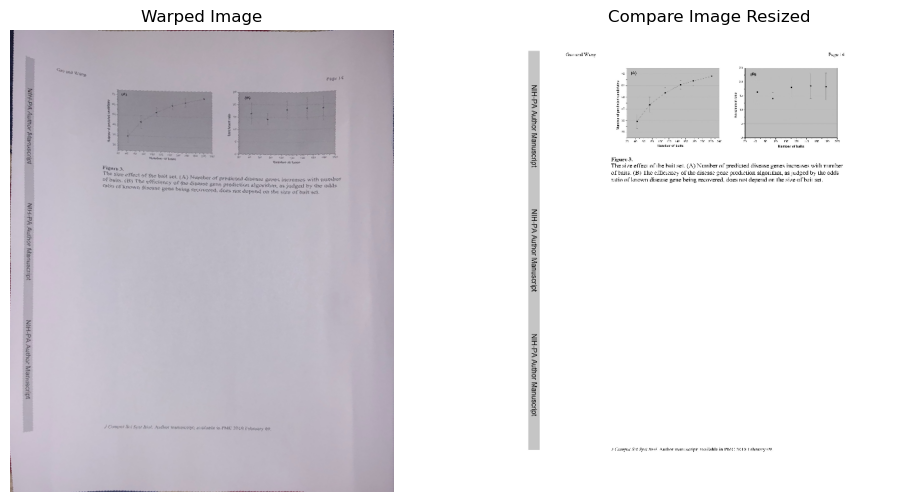

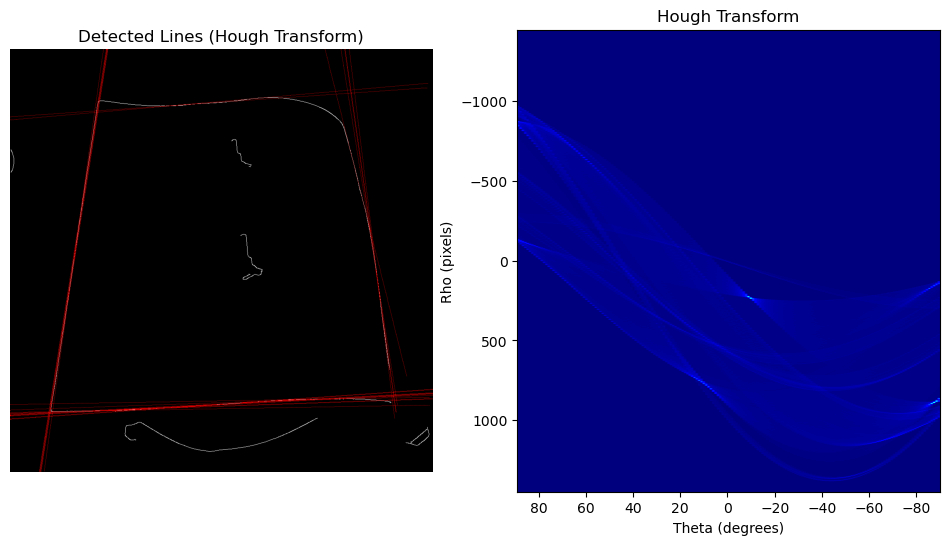

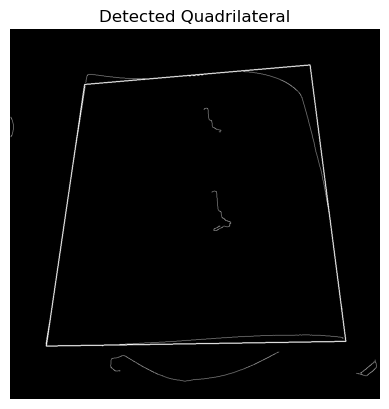

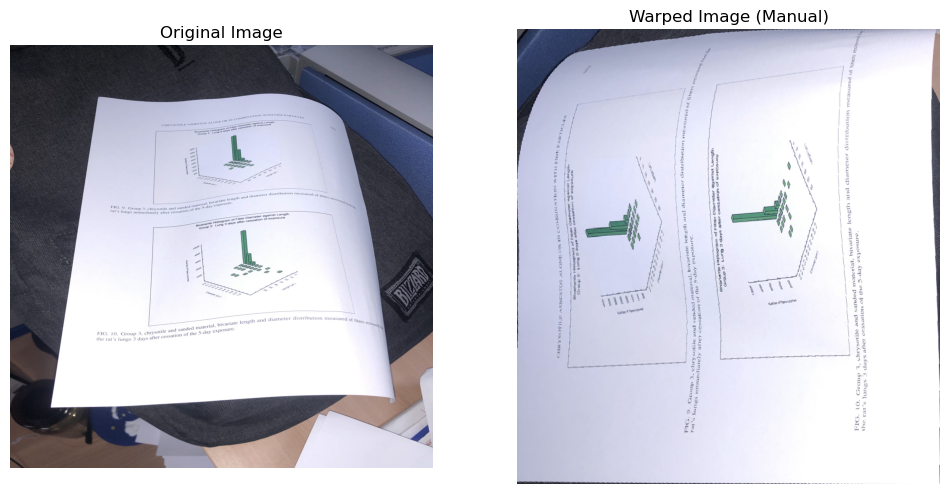

SSIM Score: 0.7110723970066953


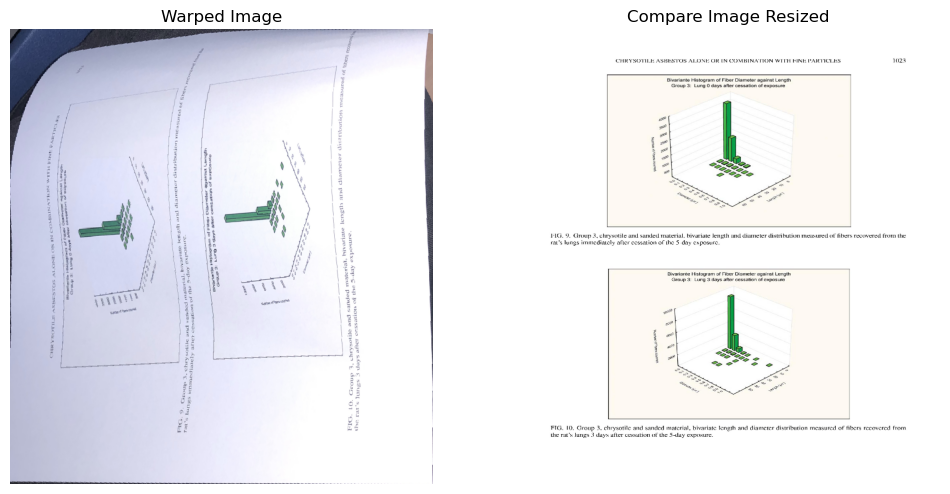

In [41]:
# ==========================
#   Results of CURVED FOLDER
# ==========================

path3 = "WarpDoc/distorted/curved/0002.jpg"
path4 = "WarpDoc/digital/curved/0002.jpg"

path5 = "WarpDoc/distorted/curved/0034.jpg"
path6 = "WarpDoc/digital/curved/0034.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=100,printing=printing)
score_gray4 = all_processes_for_one_image(path5,path6,hough_threshold=100,printing=printing)


In [61]:
# ==========================
#        FOLD FOLDER
# ==========================
distorted_dir = "WarpDoc/distorted/fold/"
digital_dir = "WarpDoc/digital/fold/"

scores = []
paths = []
printing = False
for i in range(1, 51):
    filename = f"{i:04}.jpg"
    path_distorted = os.path.join(distorted_dir, filename)
    path_digital = os.path.join(digital_dir, filename)
    
    score_gray = all_processes_for_one_image(path_distorted, path_digital, hough_threshold=90,printing=printing)
    if(score_gray is not None):
        scores.append(score_gray)
        paths.append((path_distorted, path_digital))

# Skorları ve path'leri birlikte tutup, büyükten küçüğe sıralayalım
combined = list(zip(scores, paths))
combined.sort(key=lambda x: x[0], reverse=True)

# En yüksek 2 sonucu alalım
top2 = combined[:2]

# Sonuçları yazdıralım
for idx, (score, (distorted_path, digital_path)) in enumerate(top2, 1):
    print(f"{idx}. En yüksek skor: {score}")
    print(f"   Distorted Path: {distorted_path}")
    print(f"   Digital Path:   {digital_path}")

# Calculate and print the average SSIM score
if scores:
    average_score = sum(scores) / len(scores)
    print(f"\nAverage SSIM score across all images: {average_score}")
else:
    print("\nNo SSIM scores were computed.")

Error processing image WarpDoc/distorted/fold/0010.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Error processing image WarpDoc/distorted/fold/0024.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Error processing image WarpDoc/distorted/fold/0025.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/fold/0031.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or 

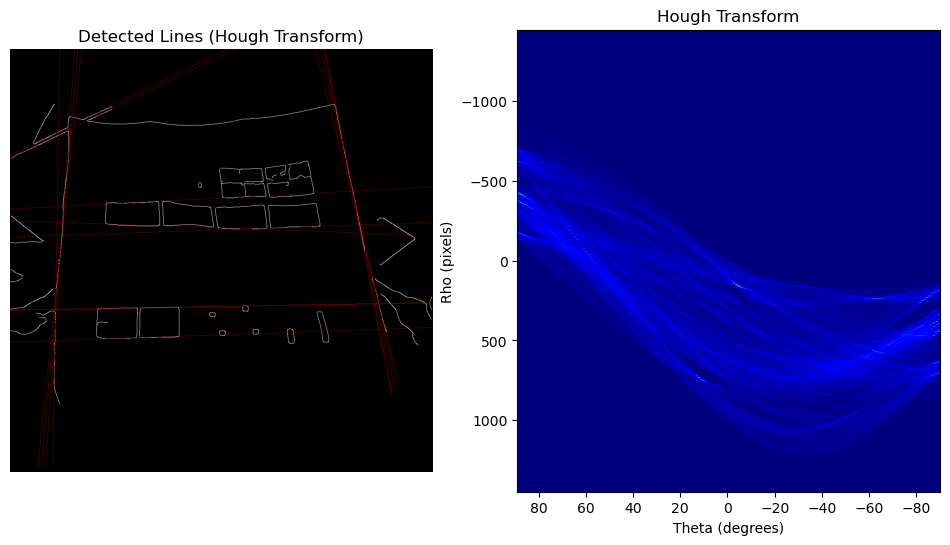

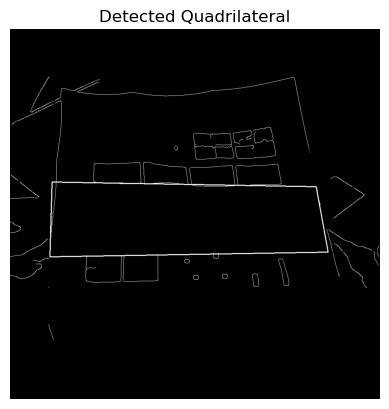

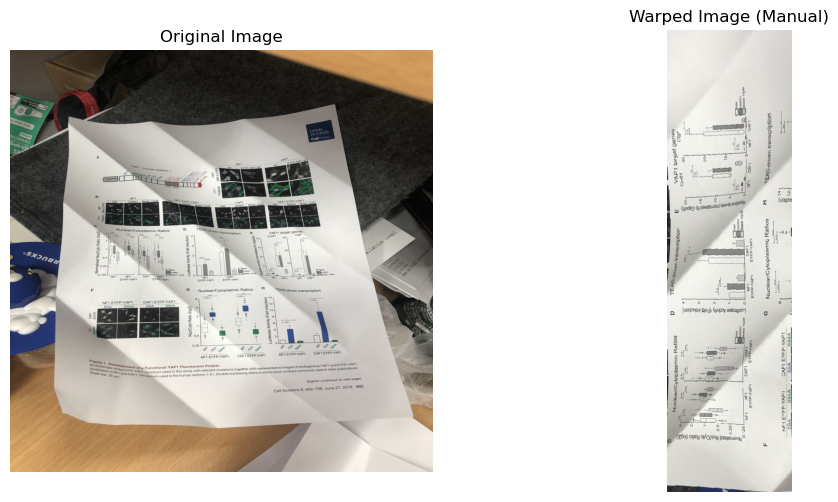

SSIM Score: 0.40868937215405515


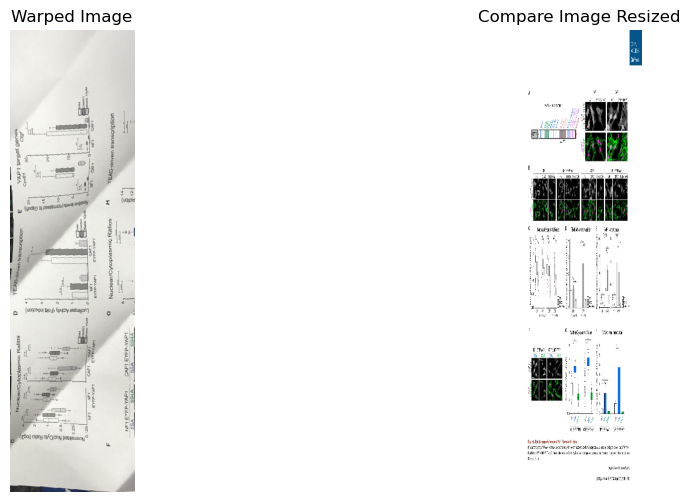

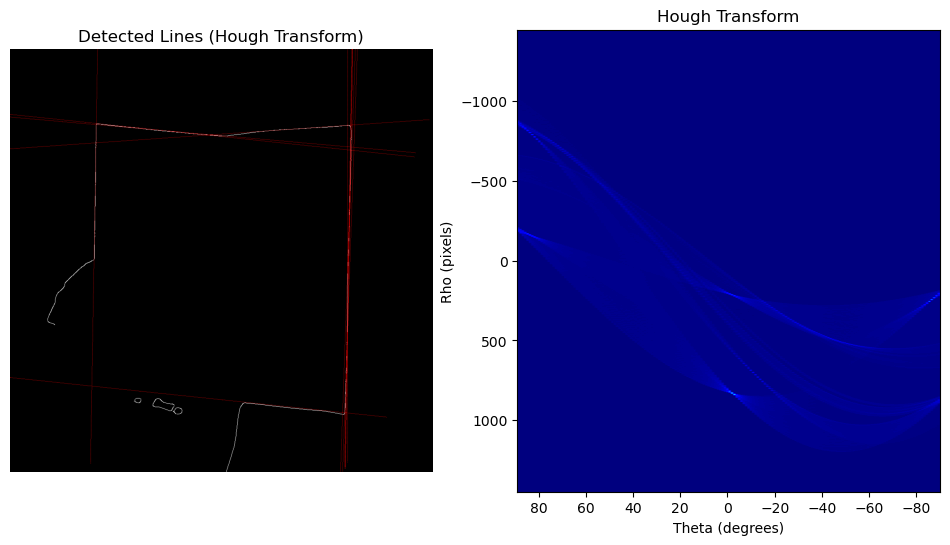

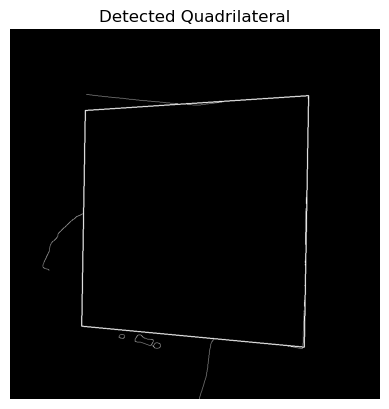

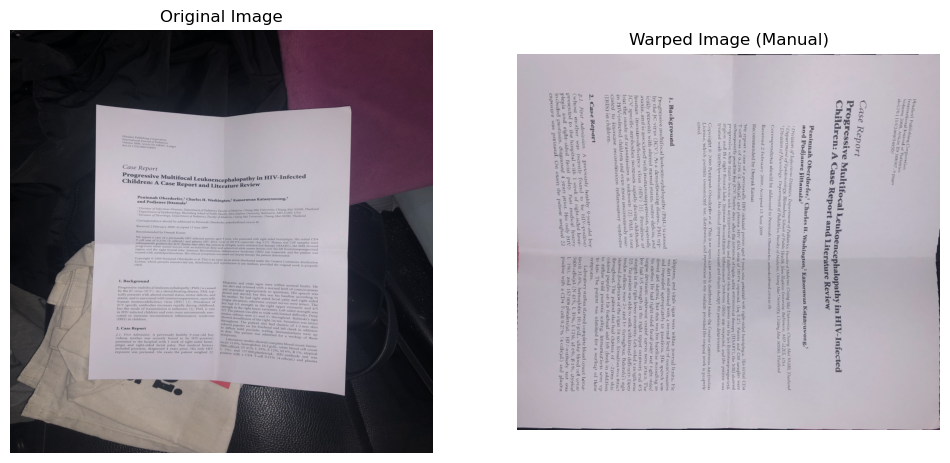

SSIM Score: 0.40957747089449265


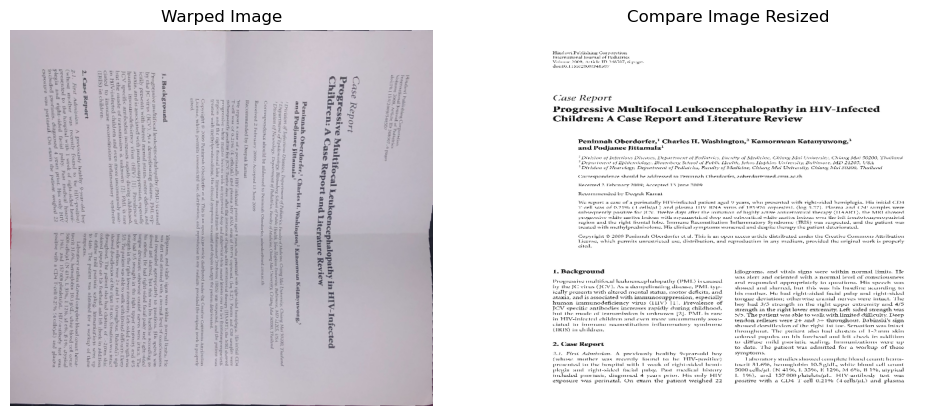

In [43]:
# ==========================
#   Results of FOLD FOLDER
# ==========================

path3 = "WarpDoc/distorted/fold/0041.jpg"
path4 = "WarpDoc/digital/fold/0041.jpg"

path5 = "WarpDoc/distorted/fold/0004.jpg"
path6 = "WarpDoc/digital/fold/0004.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=80,printing=printing)
score_gray4 = all_processes_for_one_image(path5,path6,hough_threshold=70,printing=printing)

In [62]:
# ==========================
#      INCOMPLETE FOLDER
# ==========================

distorted_dir = "WarpDoc/distorted/incomplete/"
digital_dir = "WarpDoc/digital/incomplete/"

scores = []
paths = []
printing = False
for i in range(1, 51):
    filename = f"{i:04}.jpg"
    path_distorted = os.path.join(distorted_dir, filename)
    path_digital = os.path.join(digital_dir, filename)
    
    score_gray = all_processes_for_one_image(path_distorted, path_digital, hough_threshold=80,printing=printing)
    if(score_gray is not None):
        scores.append(score_gray)
        paths.append((path_distorted, path_digital))

# Skorları ve path'leri birlikte tutup, büyükten küçüğe sıralayalım
combined = list(zip(scores, paths))
combined.sort(key=lambda x: x[0], reverse=True)

# En yüksek 2 sonucu alalım
top2 = combined[:2]

# Sonuçları yazdıralım
for idx, (score, (distorted_path, digital_path)) in enumerate(top2, 1):
    print(f"{idx}. En yüksek skor: {score}")
    print(f"   Distorted Path: {distorted_path}")
    print(f"   Digital Path:   {digital_path}")

# Calculate and print the average SSIM score
if scores:
    average_score = sum(scores) / len(scores)
    print(f"\nAverage SSIM score across all images: {average_score}")
else:
    print("\nNo SSIM scores were computed.")

Error processing image WarpDoc/distorted/incomplete/0004.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/incomplete/0011.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/incomplete/0018.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/incomplete/0023.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/incomplete/0024.jpg: OpenCV(4.11.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/resize.cpp:4211: error: (-215:Assertion failed) inv_scale_x > 0 in function 'resize'

Error processing image WarpDoc/distorted/incomplete/0028.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/incomplete/0043.jpg: OpenCV(4.11.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/resize.cpp:4211: error: (-215:Assertion f

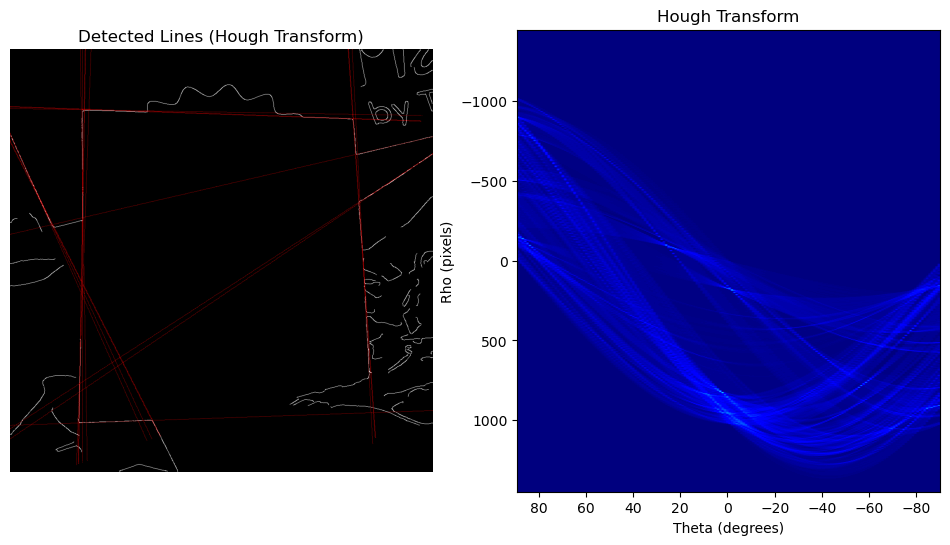

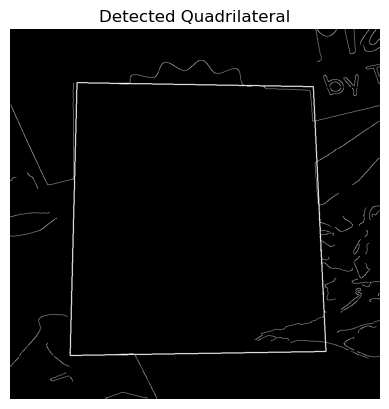

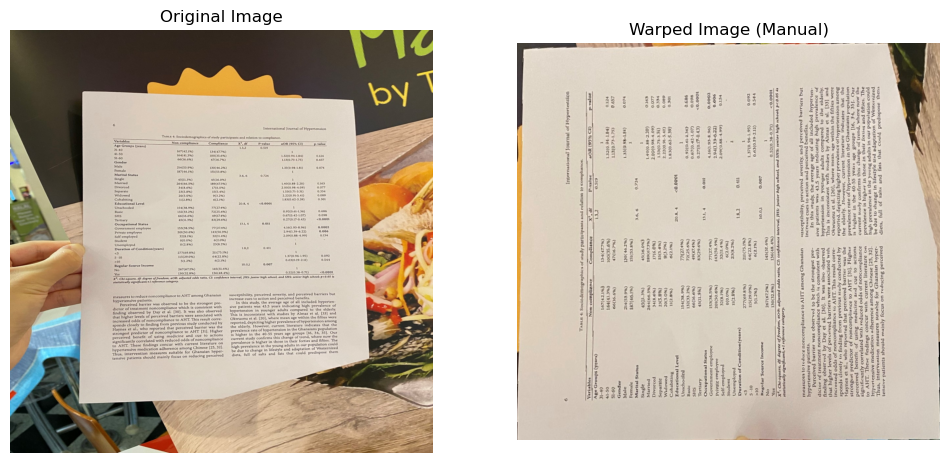

SSIM Score: 0.4295981167648563


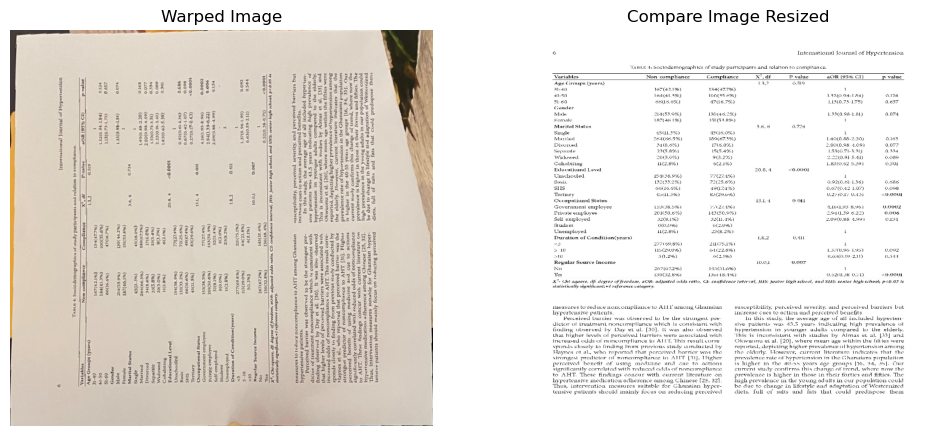

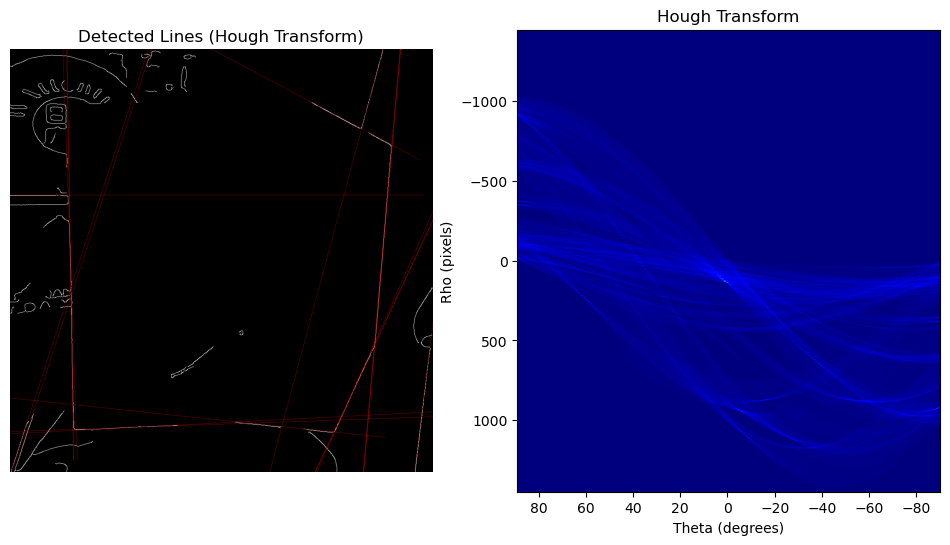

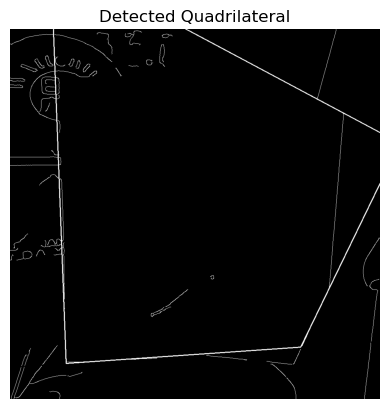

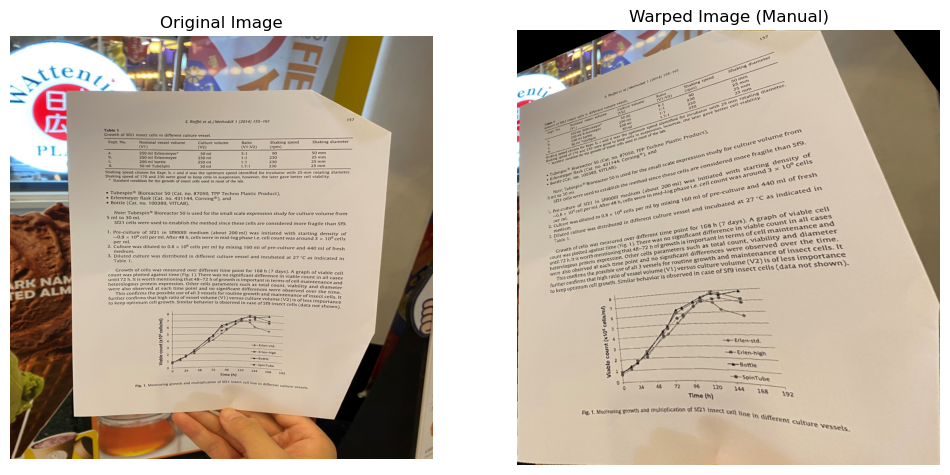

SSIM Score: 0.49503537750298476


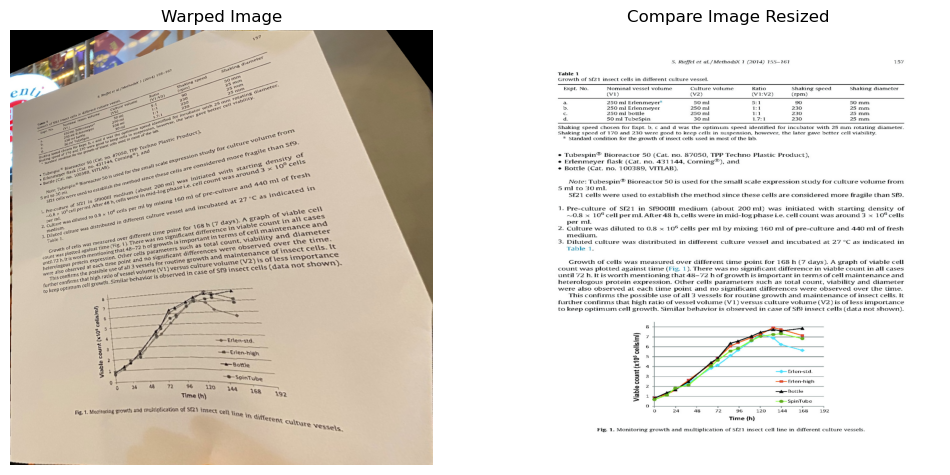

In [45]:
# ==========================
#   Results of INCOMPLETE FOLDER
# ==========================
path3 = "WarpDoc/distorted/incomplete/0034.jpg"
path4 = "WarpDoc/digital/incomplete/0034.jpg"

path5 = "WarpDoc/distorted/incomplete/0050.jpg"
path6 = "WarpDoc/digital/incomplete/0050.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=80,printing=printing)
score_gray4 = all_processes_for_one_image(path5,path6,hough_threshold=80,printing=printing)

In [63]:
# ==========================
#     PERSPECTIVE FOLDER
# ==========================

distorted_dir = "WarpDoc/distorted/perspective/"
digital_dir = "WarpDoc/digital/perspective/"

scores = []
paths = []
printing = False
for i in range(1, 51):
    filename = f"{i:04}.jpg"
    path_distorted = os.path.join(distorted_dir, filename)
    path_digital = os.path.join(digital_dir, filename)
    
    score_gray = all_processes_for_one_image(path_distorted, path_digital, hough_threshold=90,printing=printing)
    if(score_gray is not None):
        scores.append(score_gray)
        paths.append((path_distorted, path_digital))

# Skorları ve path'leri birlikte tutup, büyükten küçüğe sıralayalım
combined = list(zip(scores, paths))
combined.sort(key=lambda x: x[0], reverse=True)

# En yüksek 2 sonucu alalım
top2 = combined[:2]

# Sonuçları yazdıralım
for idx, (score, (distorted_path, digital_path)) in enumerate(top2, 1):
    print(f"{idx}. En yüksek skor: {score}")
    print(f"   Distorted Path: {distorted_path}")
    print(f"   Digital Path:   {digital_path}")

# Calculate and print the average SSIM score
if scores:
    average_score = sum(scores) / len(scores)
    print(f"\nAverage SSIM score across all images: {average_score}")
else:
    print("\nNo SSIM scores were computed.")

Error processing image WarpDoc/distorted/perspective/0003.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0005.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0013.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0019.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0022.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0025.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0031.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0045.jpg: cannot unpack non-iterable NoneType object
Error processing image WarpDoc/distorted/perspective/0048.jpg: cannot unpack non-iterable NoneType object
1. En yüksek skor: 0.639961410532917
   Distor

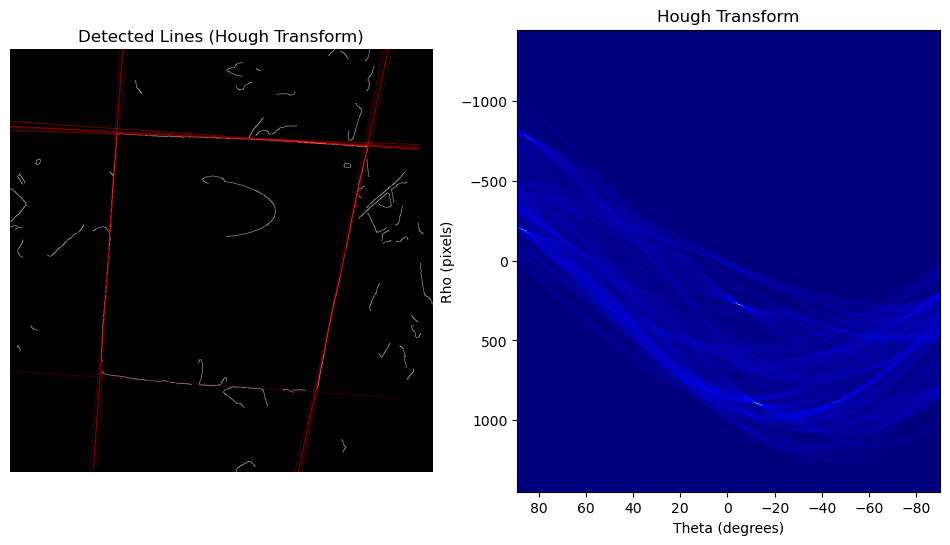

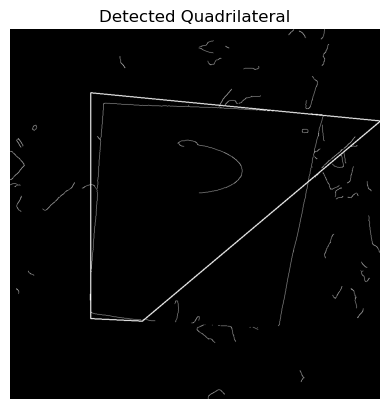

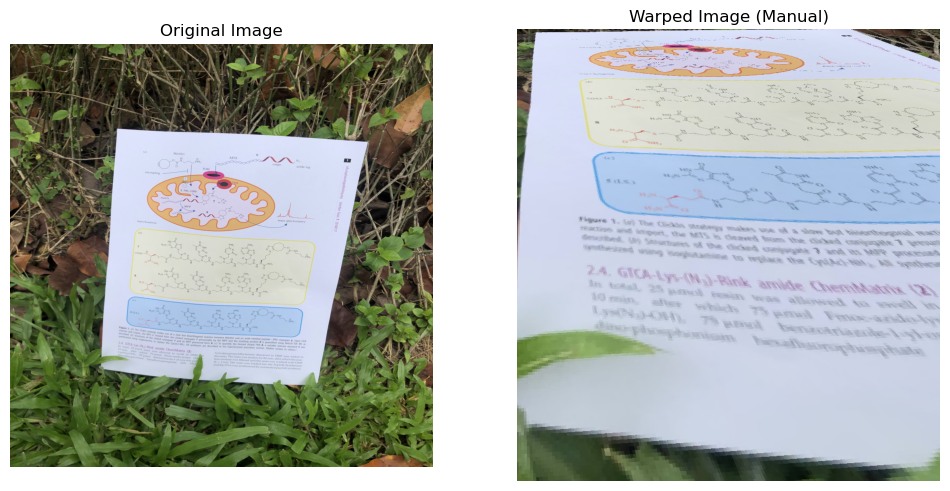

SSIM Score: 0.4766133215536745


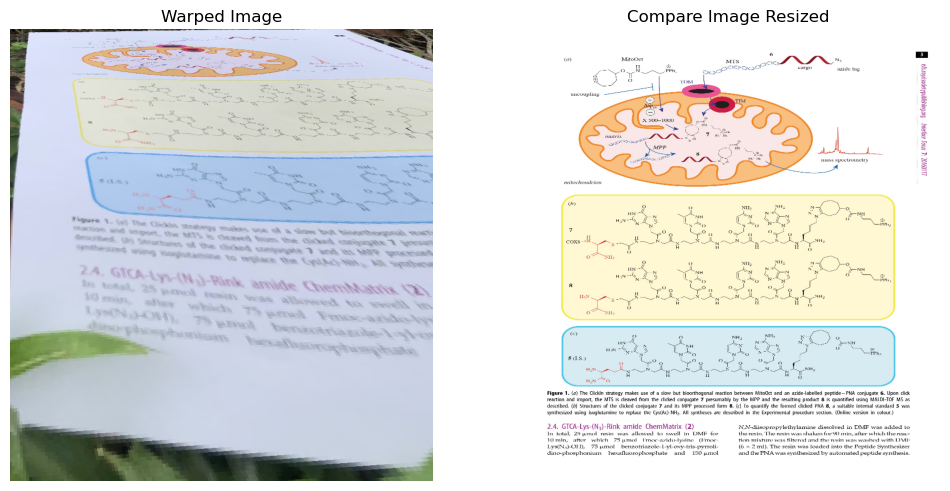

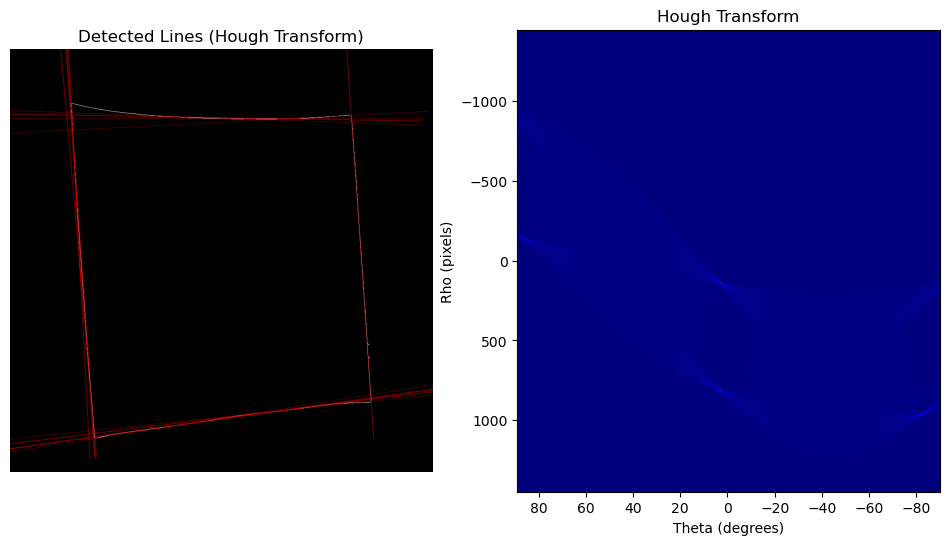

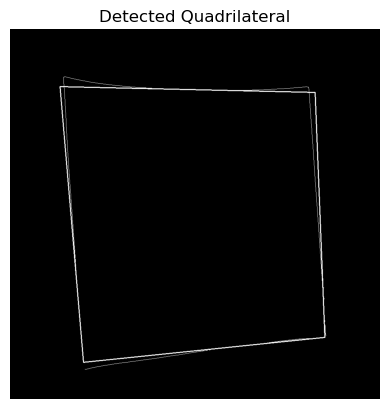

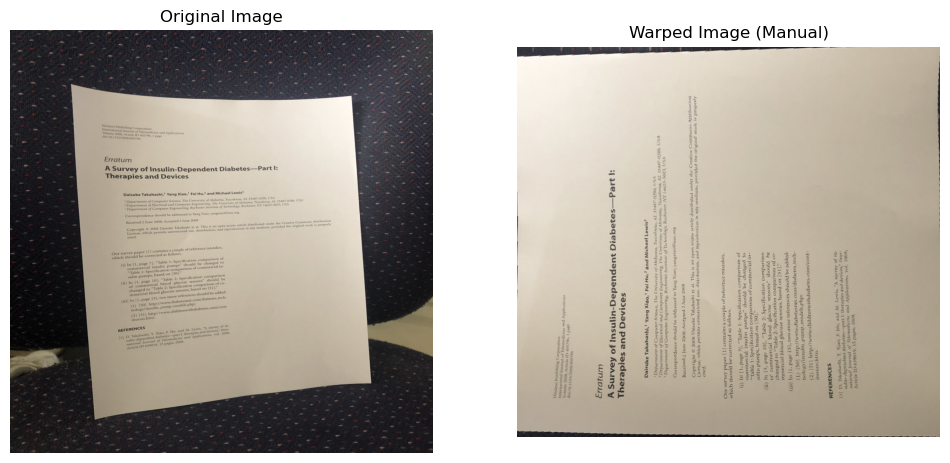

SSIM Score: 0.6344876679452989


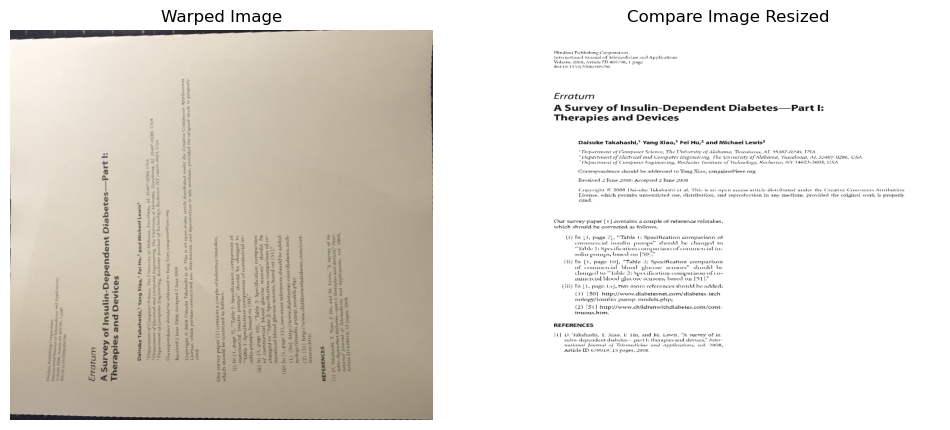

In [49]:
# ==========================
#   Results of PERSPECTIVE FOLDER
# ==========================

path3 = "WarpDoc/distorted/perspective/0021.jpg"
path4 = "WarpDoc/digital/perspective/0021.jpg"

path5 = "WarpDoc/distorted/perspective/0049.jpg"
path6 = "WarpDoc/digital/perspective/0049.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=70,printing=printing)
score_gray4 = all_processes_for_one_image(path5,path6,hough_threshold=70,printing=printing)

In [64]:
# ==========================
#     RANDOM FOLDER
# ==========================

distorted_dir = "WarpDoc/distorted/random/"
digital_dir = "WarpDoc/digital/random/"

scores = []
paths = []
printing = False
for i in range(1, 51):
    filename = f"{i:04}.jpg"
    path_distorted = os.path.join(distorted_dir, filename)
    path_digital = os.path.join(digital_dir, filename)
    
    score_gray = all_processes_for_one_image(path_distorted, path_digital, hough_threshold=80,printing=printing)
    if(score_gray is not None):
        scores.append(score_gray)
        paths.append((path_distorted, path_digital))

# Skorları ve path'leri birlikte tutup, büyükten küçüğe sıralayalım
combined = list(zip(scores, paths))
combined.sort(key=lambda x: x[0], reverse=True)

# En yüksek 2 sonucu alalım
top2 = combined[:2]

# Sonuçları yazdıralım
for idx, (score, (distorted_path, digital_path)) in enumerate(top2, 1):
    print(f"{idx}. En yüksek skor: {score}")
    print(f"   Distorted Path: {distorted_path}")
    print(f"   Digital Path:   {digital_path}")

# Calculate and print the average SSIM score
if scores:
    average_score = sum(scores) / len(scores)
    print(f"\nAverage SSIM score across all images: {average_score}")
else:
    print("\nNo SSIM scores were computed.")

Error processing image WarpDoc/distorted/random/0001.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Error processing image WarpDoc/distorted/random/0019.jpg: OpenCV(4.11.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/resize.cpp:4211: error: (-215:Assertion failed) inv_scale_x > 0 in function 'resize'

Error processing image WarpDoc/distorted/random/0021.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number correspon

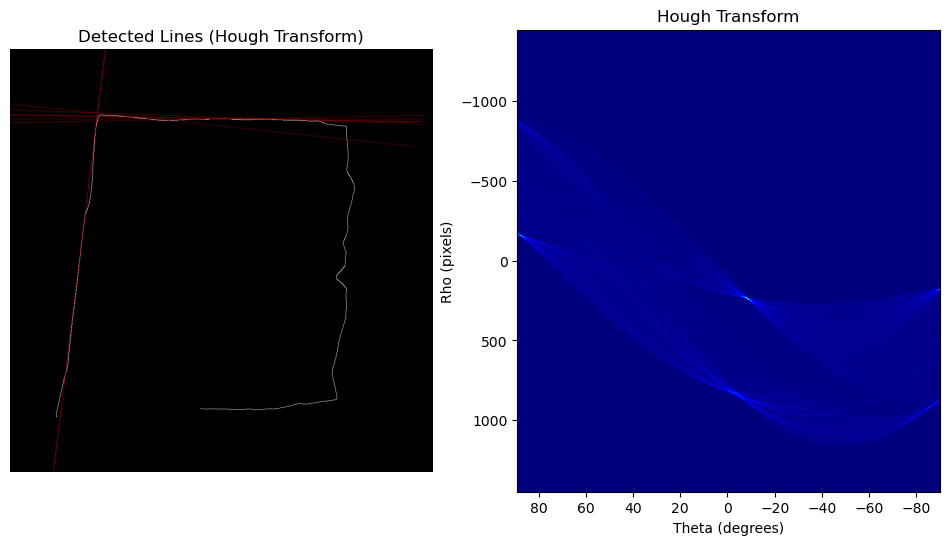

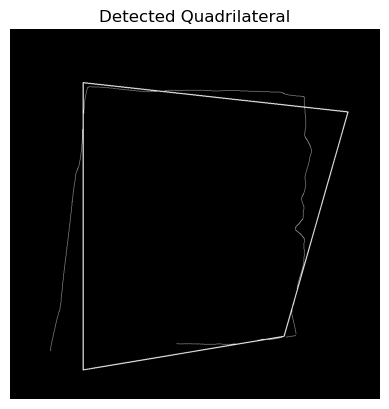

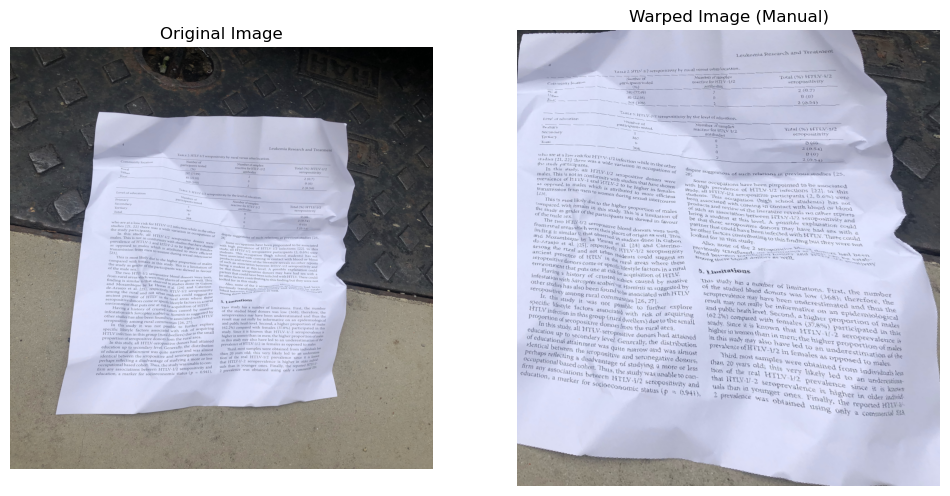

SSIM Score: 0.29738558347905014


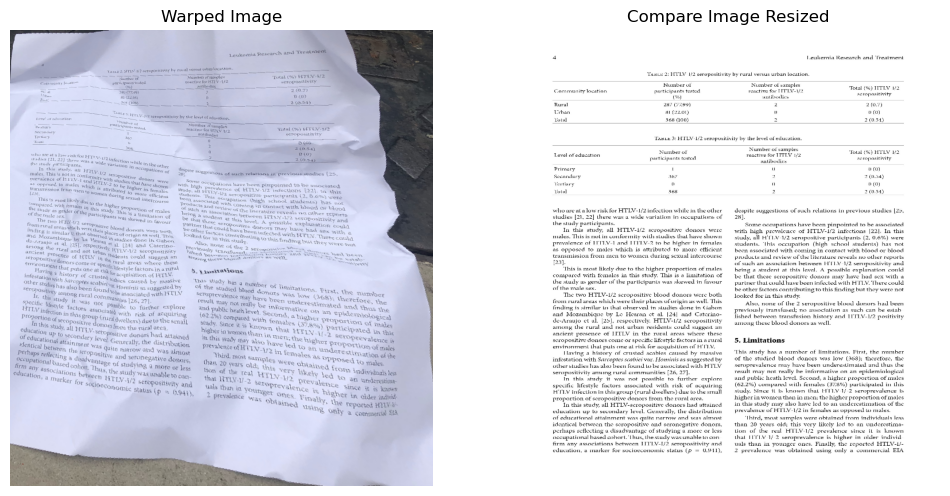

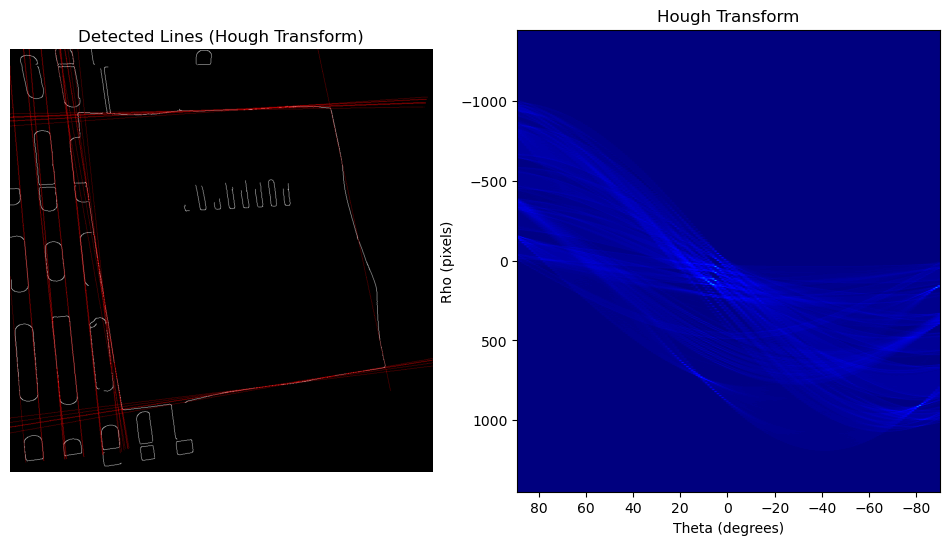

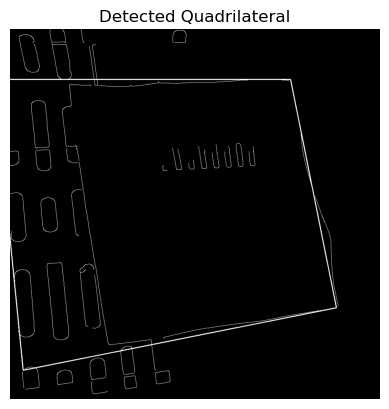

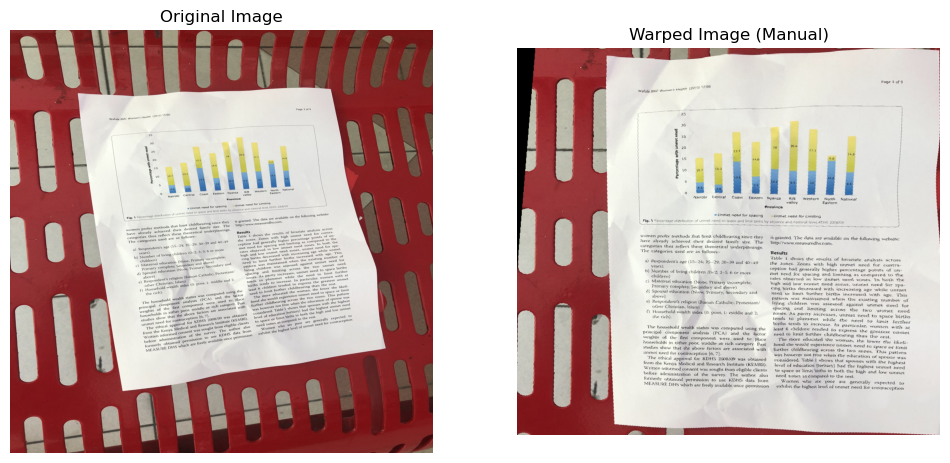

SSIM Score: 0.450210559459998


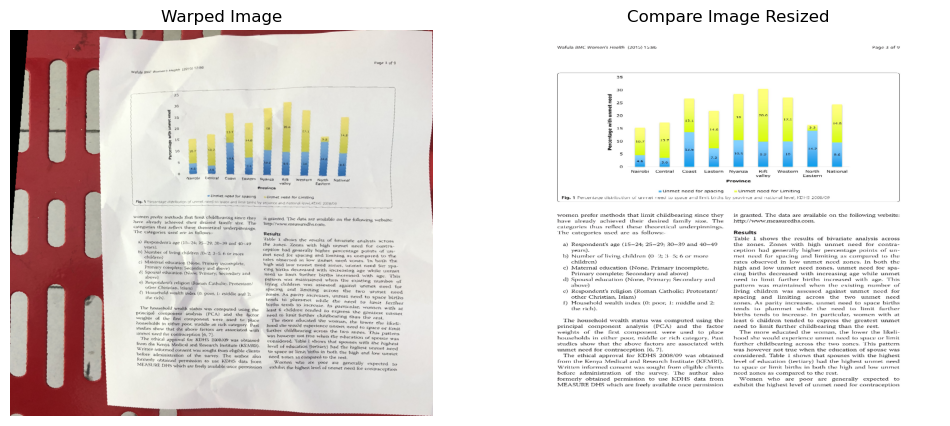

In [59]:
# ==========================
#   Results of RANDOM FOLDER
# ==========================

path3 = "WarpDoc/distorted/random/0008.jpg"
path4 = "WarpDoc/digital/random/0008.jpg"

path5 = "WarpDoc/distorted/random/0010.jpg"
path6 = "WarpDoc/digital/random/0010.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=50,printing=printing)
score_gray4 = all_processes_for_one_image(path5,path6,hough_threshold=80,printing=printing)

In [65]:
# ==========================
#     ROTATE FOLDER
# ==========================

distorted_dir = "WarpDoc/distorted/rotate/"
digital_dir = "WarpDoc/digital/rotate/"

scores = []
paths = []
printing = False
for i in range(1, 51):
    filename = f"{i:04}.jpg"
    path_distorted = os.path.join(distorted_dir, filename)
    path_digital = os.path.join(digital_dir, filename)
    
    score_gray = all_processes_for_one_image(path_distorted, path_digital, hough_threshold=100,printing=printing)
    if(score_gray is not None):
        scores.append(score_gray)
        paths.append((path_distorted, path_digital))

# Skorları ve path'leri birlikte tutup, büyükten küçüğe sıralayalım
combined = list(zip(scores, paths))
combined.sort(key=lambda x: x[0], reverse=True)

# En yüksek 2 sonucu alalım
top2 = combined[:2]

# Sonuçları yazdıralım
for idx, (score, (distorted_path, digital_path)) in enumerate(top2, 1):
    print(f"{idx}. En yüksek skor: {score}")
    print(f"   Distorted Path: {distorted_path}")
    print(f"   Digital Path:   {digital_path}")

# Calculate and print the average SSIM score
if scores:
    average_score = sum(scores) / len(scores)
    print(f"\nAverage SSIM score across all images: {average_score}")
else:
    print("\nNo SSIM scores were computed.")

Error processing image WarpDoc/distorted/rotate/0008.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Error processing image WarpDoc/distorted/rotate/0024.jpg: OpenCV(4.11.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/resize.cpp:4211: error: (-215:Assertion failed) inv_scale_x > 0 in function 'resize'

Error processing image WarpDoc/distorted/rotate/0039.jpg: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number correspon

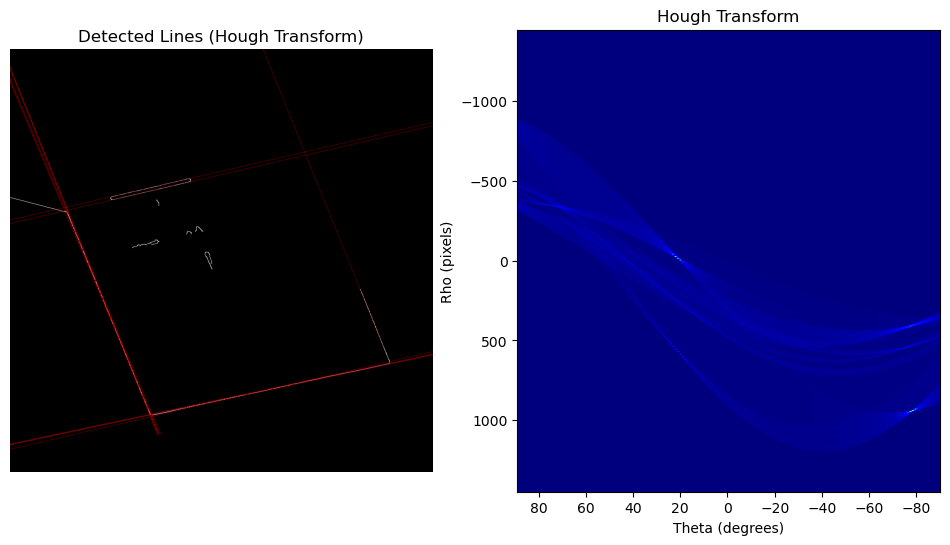

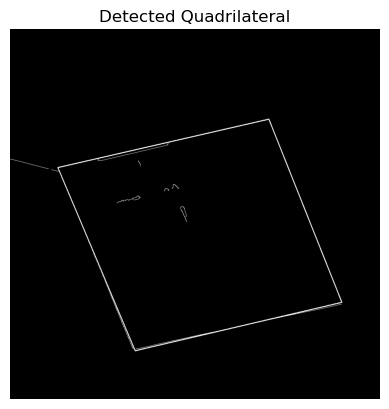

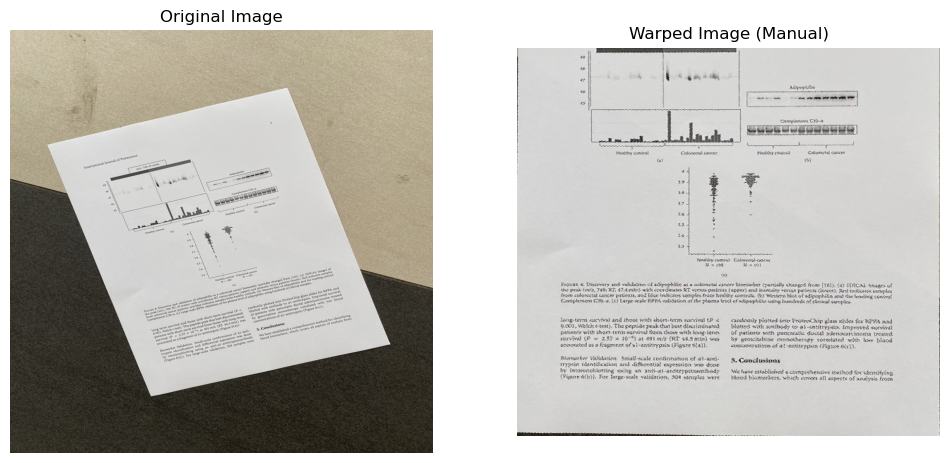

SSIM Score: 0.582765762277569


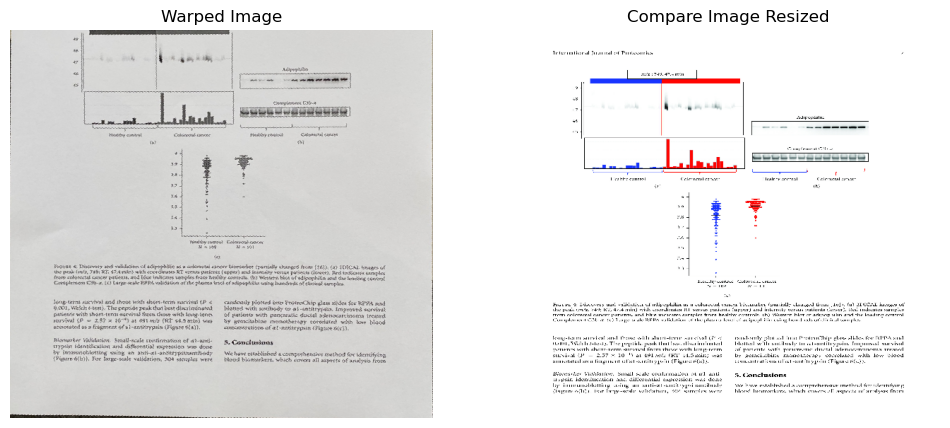

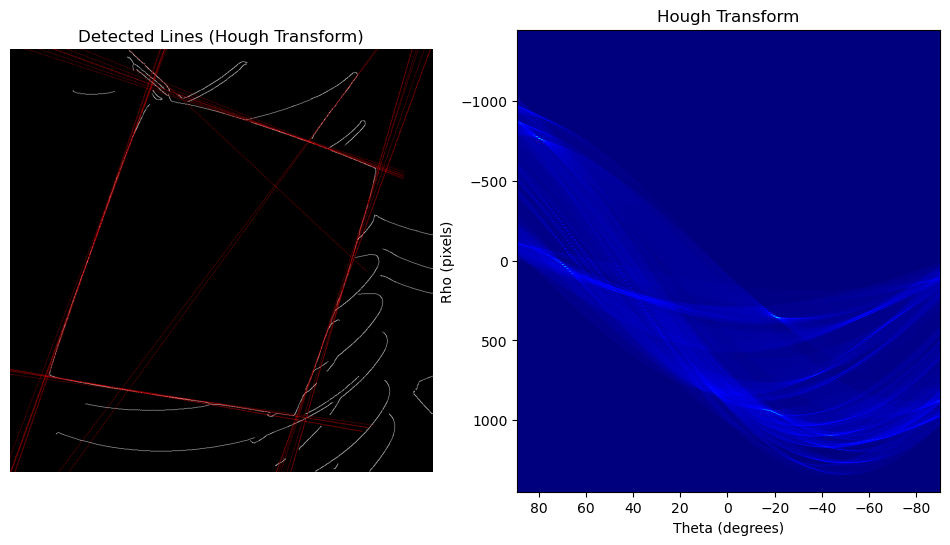

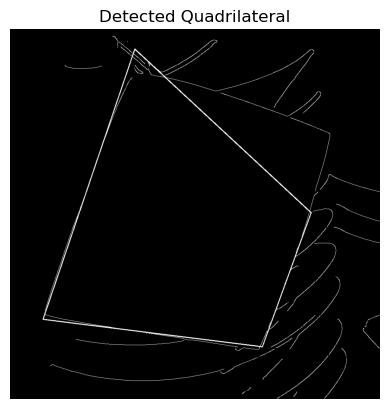

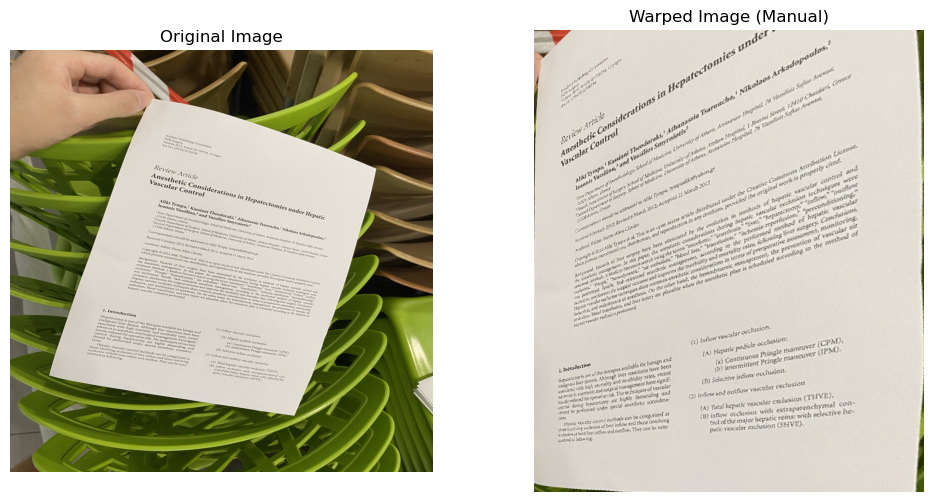

SSIM Score: 0.47245113540886213


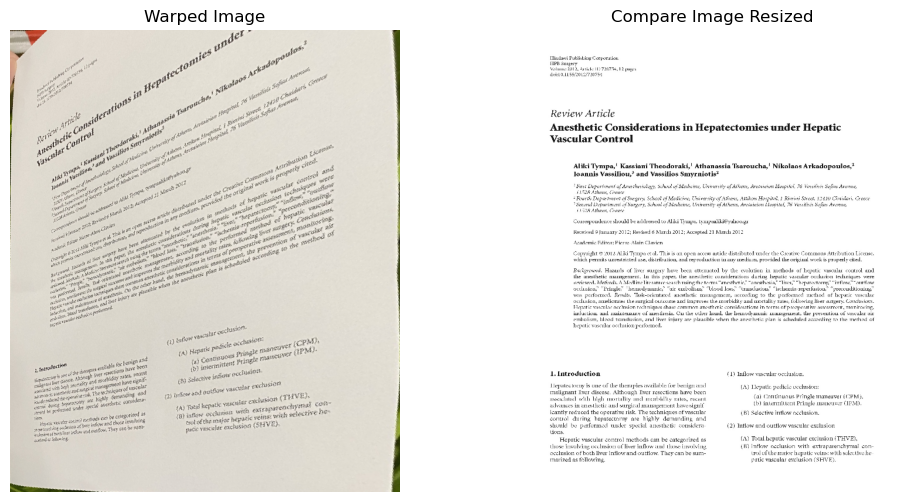

In [57]:
# ==========================
#   Results of ROTATE FOLDER
# ==========================

path3 = "WarpDoc/distorted/rotate/0006.jpg"
path4 = "WarpDoc/digital/rotate/0006.jpg"

path5 = "WarpDoc/distorted/rotate/0034.jpg"
path6 = "WarpDoc/digital/rotate/0034.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=100,printing=printing)
score_gray4 = all_processes_for_one_image(path5,path6,hough_threshold=100,printing=printing)

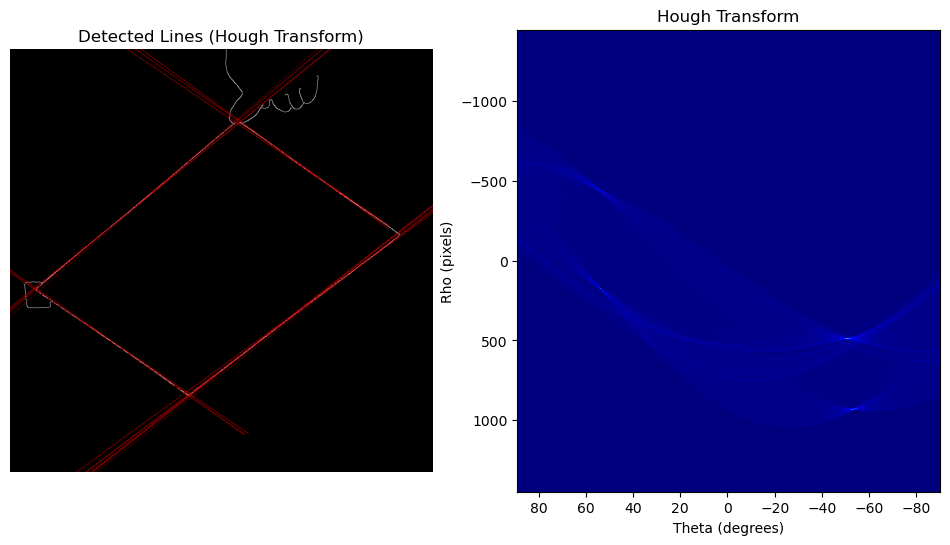

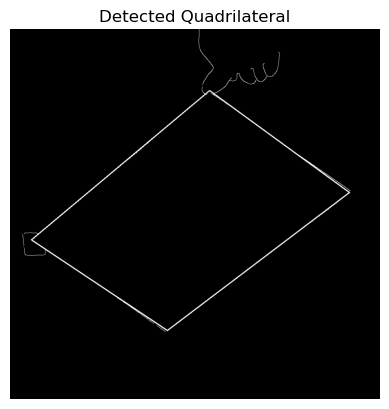

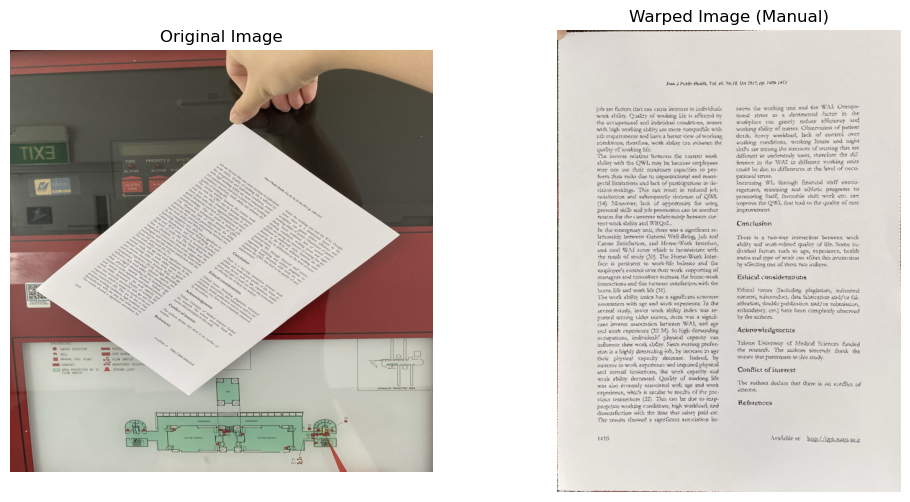

SSIM Score: 0.42657085430794733


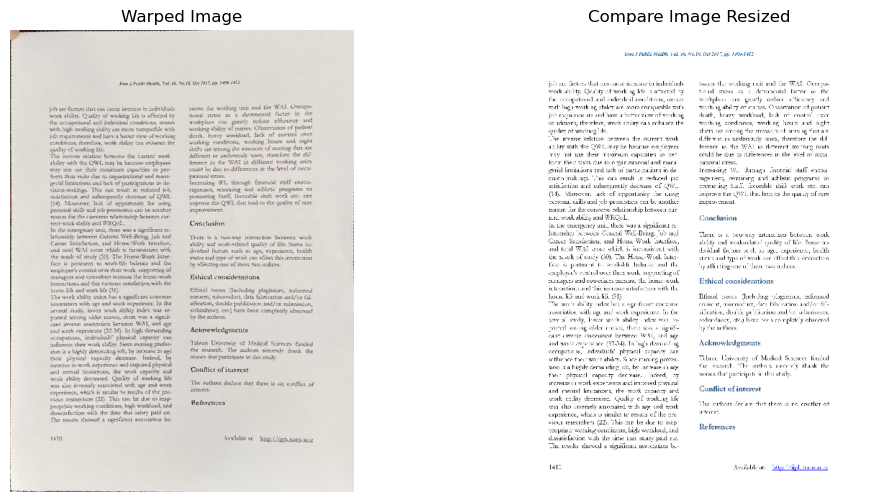

In [58]:
# For Testing:

path3 = "WarpDoc/distorted/rotate/0001.jpg"
path4 = "WarpDoc/digital/rotate/0001.jpg"
printing = True
score_gray3 = all_processes_for_one_image(path3,path4,hough_threshold=130,printing=printing)